In [206]:
import pandas as pd
%matplotlib inline

In [207]:
#Load the data, parse the date, display first five rows

path='Crime_Data_from_2020_to_Present.csv'
data=pd.read_csv(path,parse_dates=['DATE OCC'])
data.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,01/08/2020 12:00:00 AM,2020-01-08,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,2020-01-01,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,2020-02-13,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,...,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,2020-01-01,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,2020-01-01,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


In [208]:
data.shape

(686436, 28)

In [209]:
#Drop Crm Cd columns and missing values
data=data.drop(columns=['Crm Cd 1', 'Crm Cd 2','Crm Cd 3','Crm Cd 4'])
print("Before dropping: "+str(data.shape))
print("After dropping: "+str(data.dropna().shape))
new_data=data.dropna()


Before dropping: (686436, 24)
After dropping: (56500, 24)


In [210]:
#Get the city map to show:
#Use latitude data in between [33.7420, 34.2339] Use longitude data in between [-117.8572, -118.5905]
filtered_data = new_data[(new_data['LAT'] >= 33.7420) & (new_data['LAT'] <= 34.2339) & (new_data['LON'] >= -118.5905) & (new_data['LON'] <= -117.8572)]
filtered_data.shape

(52261, 24)

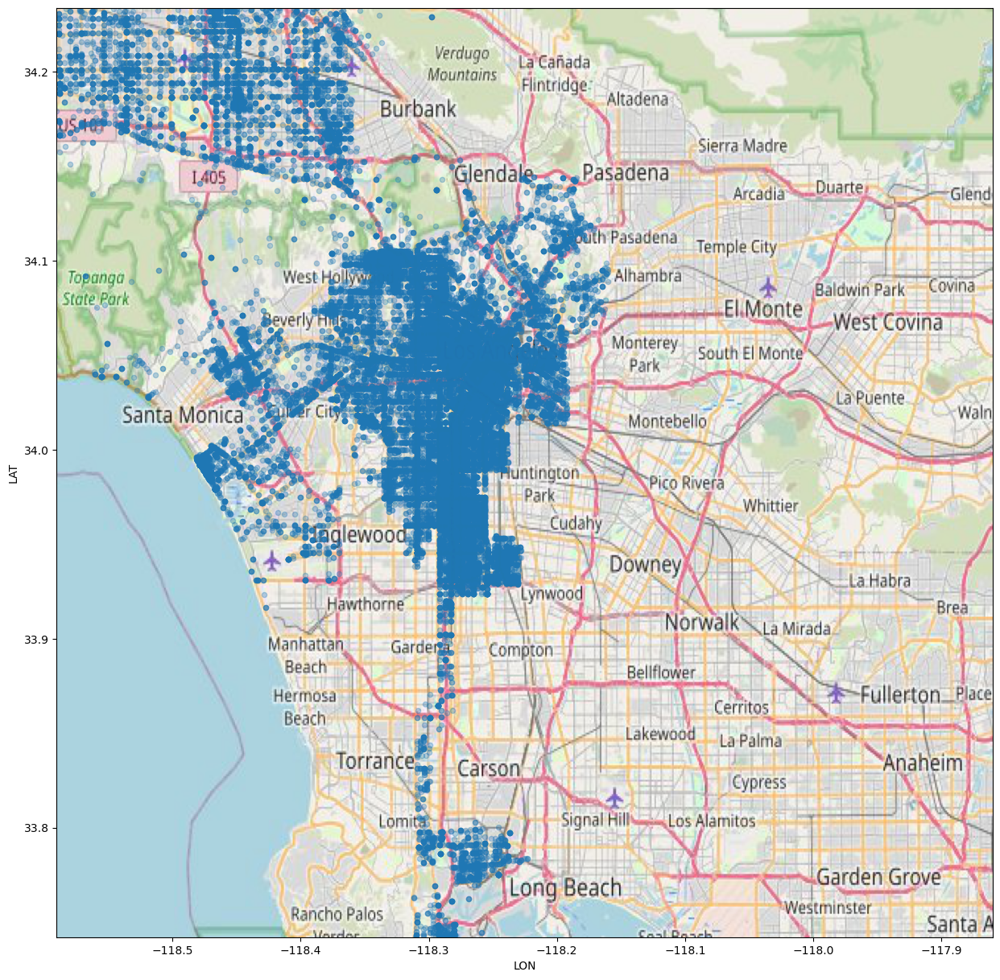

In [211]:
#Plot all crimes on the map using scatter plot:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
crime_img=mpimg.imread('map.jpg')
min_longitude = filtered_data['LON'].min()
max_longitude = filtered_data['LON'].max() 
min_latitude = filtered_data['LAT'].min()
max_latitude = filtered_data['LAT'].max()

filtered_data.plot(kind='scatter',x='LON',y='LAT', alpha=0.3,
                    figsize = (15,15))
plt.imshow(crime_img, extent=[min_longitude, max_longitude + 0.3, min_latitude, max_latitude],aspect='auto')

<AxesSubplot:ylabel='AREA NAME'>

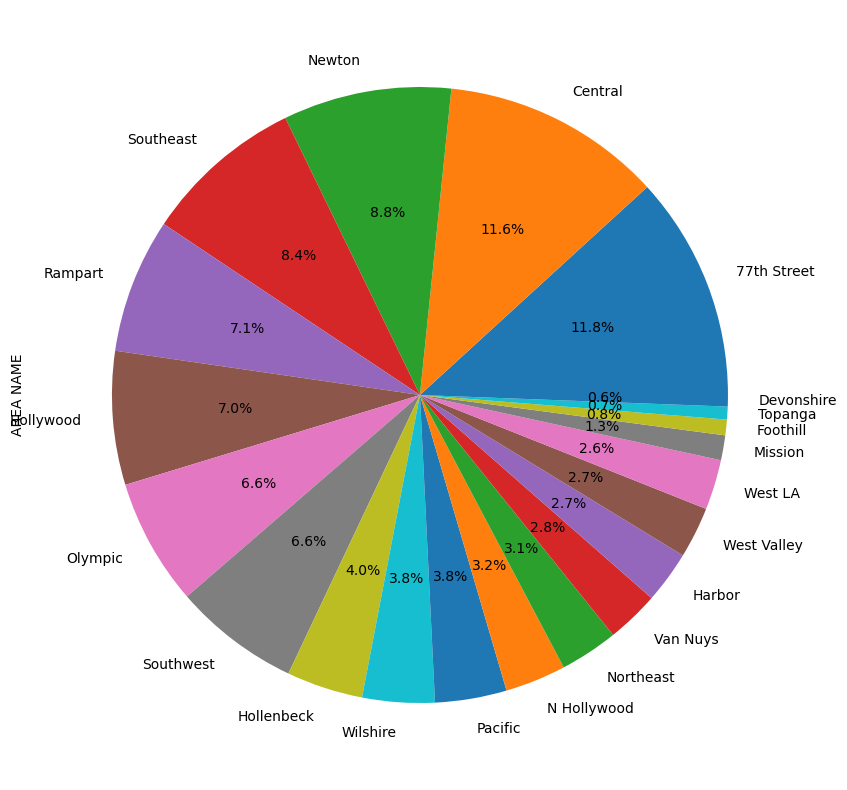

In [212]:
#Plot a pie chart for all the areas:

#filtered_data['AREA NAME'].value_counts().plot.pie()
filtered_data['AREA NAME'].value_counts().plot.pie(figsize=(10,10), autopct='%1.1f%%')

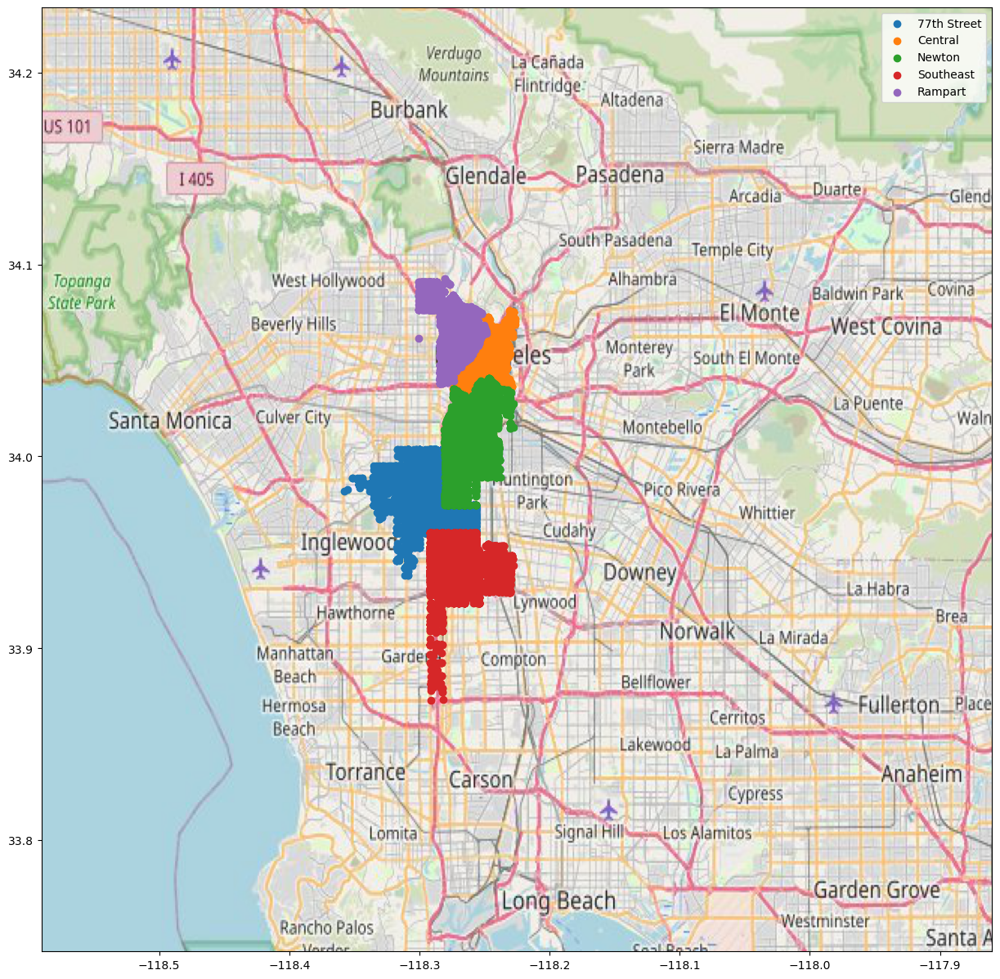

In [213]:
#Plot top 5 worst areas on map:
filtered_data['AREA NAME'].value_counts()
worst_5 = list(filtered_data['AREA NAME'].value_counts().index[:5])
for area in worst_5:
    x = filtered_data[filtered_data['AREA NAME'] == area]['LON']
    y = filtered_data[filtered_data['AREA NAME'] == area]['LAT']
    plt.scatter(x,y,alpha=1,label=area)
plt.imshow(crime_img, extent=[min_longitude, max_longitude + 0.3 , min_latitude, max_latitude],aspect='auto')
plt.rcParams["figure.figsize"] = [18,15]
plt.legend()

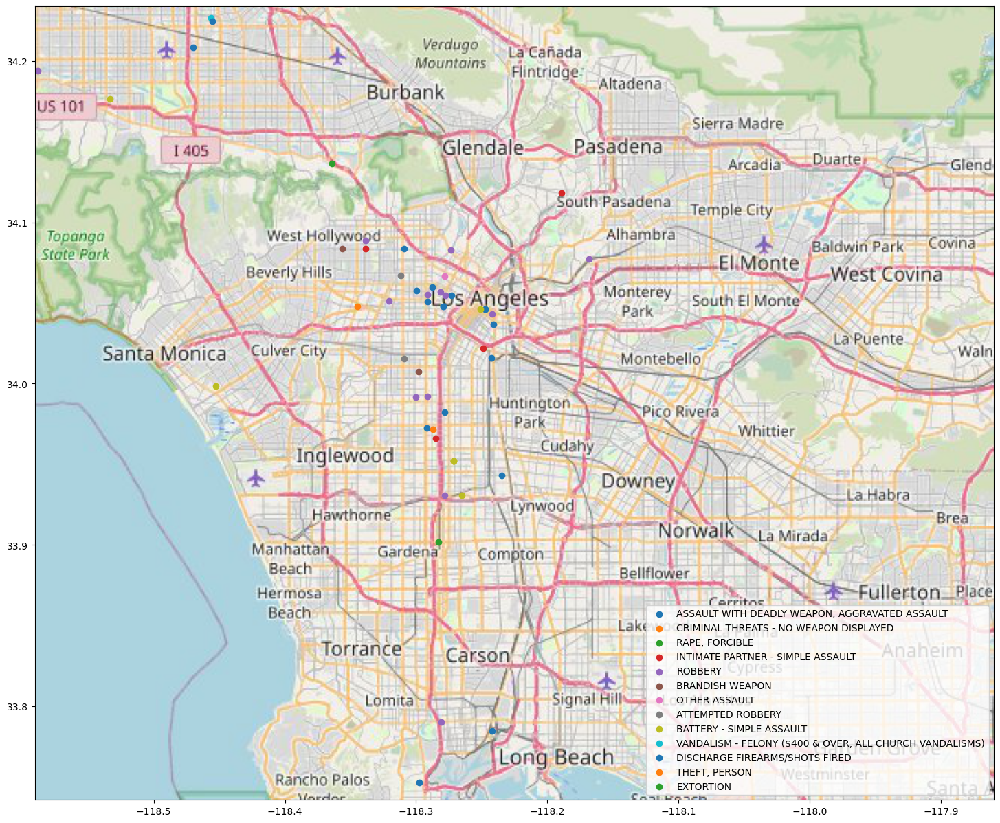

In [214]:
#(i)Plot crimes committd on 2020-07-04 on the map:
date_crime= filtered_data[filtered_data['DATE OCC'] == '2020-07-04']
crime_lists = list(date_crime['Crm Cd Desc'].unique())

for crime_list in crime_lists:
    
    crime_data = date_crime[date_crime['Crm Cd Desc'] == crime_list]
    x = crime_data['LON']
    y = crime_data['LAT']
    plt.scatter(x, y, alpha=1, label=crime_list)

plt.imshow(crime_img, extent=[min_longitude, max_longitude + 0.3 , min_latitude, max_latitude],aspect='auto')
plt.rcParams["figure.figsize"] = [13,13]
plt.legend(scatterpoints=1, loc=4)

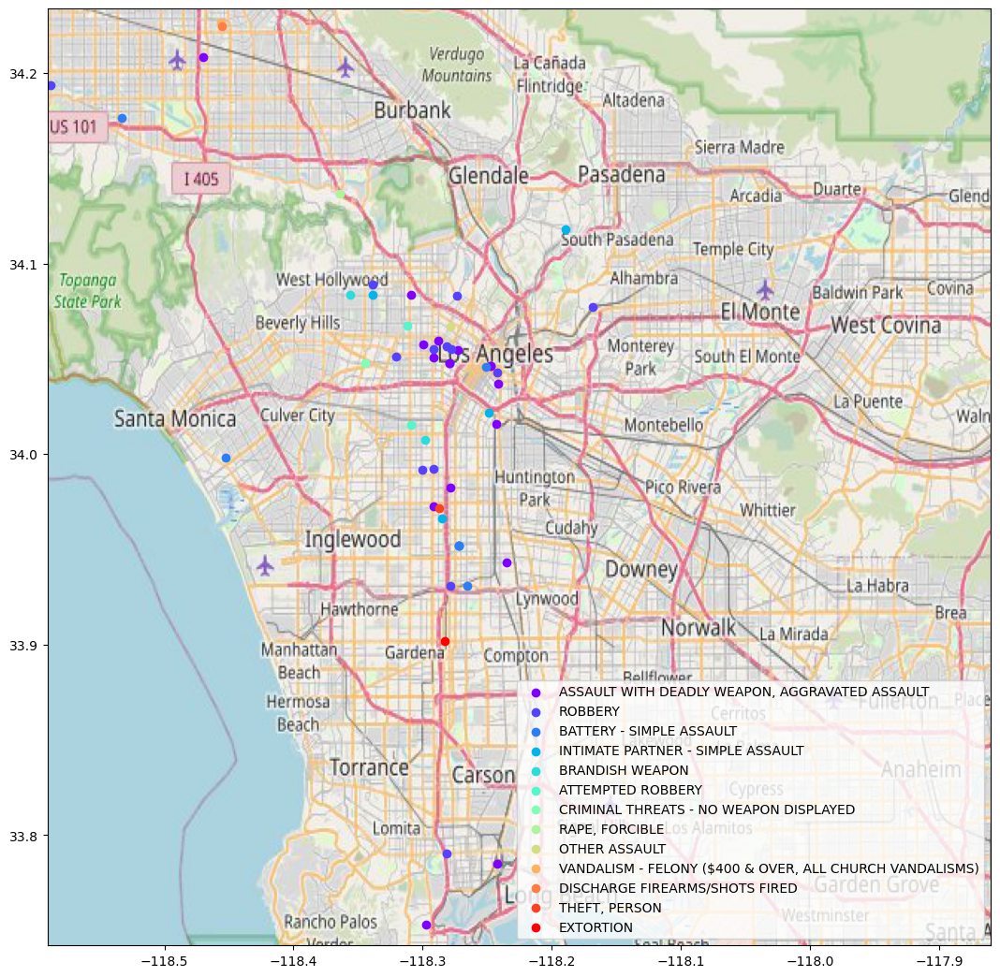

In [215]:
#(ii)Plot crimes committd on 2020-07-04 on the map in rainbow colors:
import numpy as np
import matplotlib.cm as cm
crime_lists = list(date_crime['Crm Cd Desc'].value_counts().index)
colors = cm.rainbow(np.linspace(0, 1, len(crime_lists)))
for crime_list, c in zip(crime_lists,colors):
   
    crime_data = date_crime[date_crime['Crm Cd Desc'] == crime_list]
    x = crime_data['LON']
    y = crime_data['LAT']
    plt.scatter(x, y, color=c, alpha=1, label=crime_list)

plt.imshow(crime_img, extent=[min_longitude, max_longitude + 0.3 , min_latitude, max_latitude],aspect='auto')
plt.rcParams["figure.figsize"] = [13,13]
plt.legend(scatterpoints=1, loc=4)

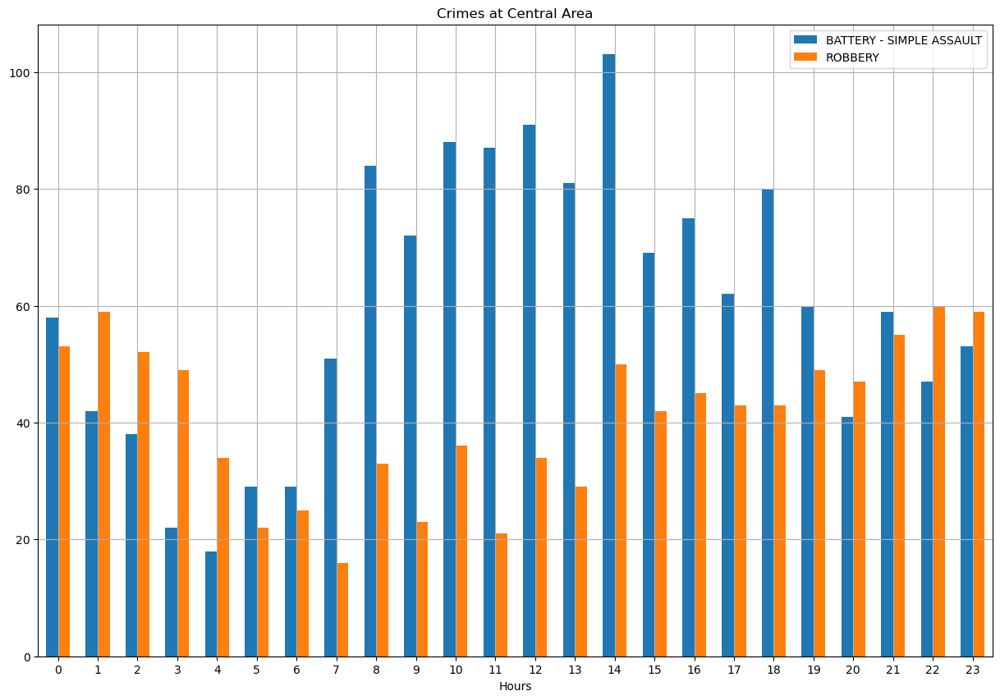

In [216]:
#Plot a bar chart for battery and robbery crimes at the Central area (hourly)
Central_crime=new_data[new_data['AREA NAME'] == 'Central']
Central_crime_battery = Central_crime[Central_crime['Crm Cd Desc'] == 'BATTERY - SIMPLE ASSAULT']
Central_crime_robbery = Central_crime[Central_crime['Crm Cd Desc'] == 'ROBBERY']
Central_battery_time_series = Central_crime_battery['TIME OCC'].value_counts()
Central_robbery_time_series = Central_crime_robbery['TIME OCC'].value_counts()
sorted_central_battery_time = Central_battery_time_series.sort_index()
sorted_central_robbery_time = Central_robbery_time_series.sort_index()

new_series_battery = {}
new_series_robbery = {}
for i in sorted_central_battery_time.index:
    if i < 60:
        try:
            new_series_battery[i//60] += sorted_central_battery_time[i]                        
        except:
            new_series_battery[i//60] = sorted_central_battery_time[i]
    elif len(str(i)) == 3:
        try:
            key = int(str(i)[0])
            new_series_battery[key] += sorted_central_battery_time[i]            
        except:
            new_series_battery[key] = sorted_central_battery_time[i]
    else:
        try:
            key = int(str(i)[:2])
            new_series_battery[key] += sorted_central_battery_time[i]            
        except:
            new_series_battery[key] = sorted_central_battery_time[i]
for i in sorted_central_robbery_time.index:
    if i < 60:
        try:
            new_series_robbery[i//60] += sorted_central_robbery_time[i]                        
        except:
            new_series_robbery[i//60] = sorted_central_robbery_time[i]
    elif len(str(i)) == 3:
        try:
            key = int(str(i)[0])
            new_series_robbery[key] += sorted_central_robbery_time[i]            
        except:
            new_series_robbery[key] = sorted_central_robbery_time[i]
    else:
        try:
            key = int(str(i)[:2])
            new_series_robbery[key] += sorted_central_robbery_time[i]            
        except:
            new_series_robbery[key] = sorted_central_robbery_time[i]
new_series_battery = pd.Series(new_series_battery)
new_series_robbery = pd.Series(new_series_robbery)
fig, ax = plt.subplots(figsize=(15,10))
ax.bar(new_series_battery.index - 0.15, new_series_battery, width=0.3,label='BATTERY - SIMPLE ASSAULT')
ax.bar(new_series_robbery.index + 0.15, new_series_robbery, width=0.3,label='ROBBERY')
ax.legend()
plt.title('Crimes at Central Area')
plt.xlabel('Hours')
plt.xticks(range(0, 24))
plt.xlim(-0.5, 23.5)
plt.grid(axis='y')
plt.grid(axis='x', which='both')
#plt.show()

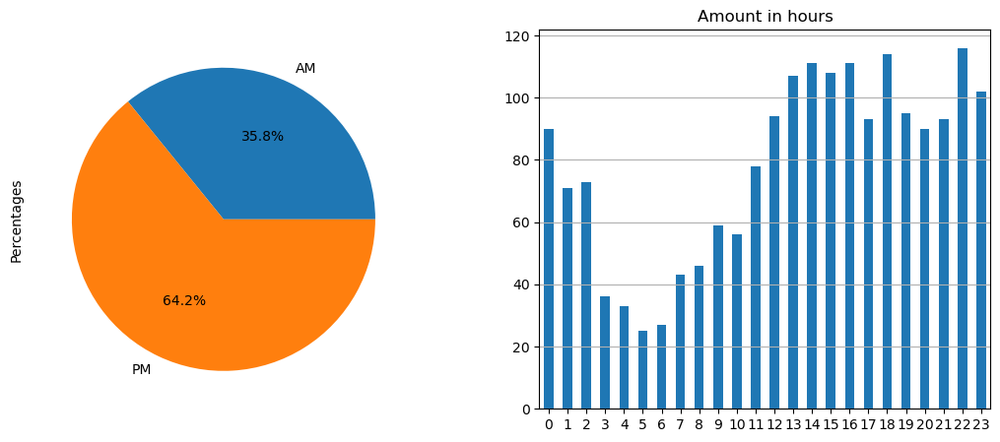

In [217]:
#Find the most commited crime in the absolute worst area, and plot the following chart
worst= new_data['AREA NAME'].value_counts().index.tolist()[0]
worst_df = new_data[(new_data['AREA NAME'] == worst)]
most=worst_df['Crm Cd Desc'].value_counts().index.tolist()[0]
most_worst1=worst_df[(worst_df['Crm Cd Desc'] == most)]
worst_place_time_series = most_worst1['TIME OCC'].value_counts()
sorted_worst_time = worst_place_time_series.sort_index()
sorted_worst_time
new_series = {}
for i in sorted_worst_time.index:
    if i < 60:
        try:
            new_series[i//60] += sorted_worst_time[i]
                        
        except:
            new_series[i//60] = sorted_worst_time[i]         
            
    elif len(str(i)) == 3:
        try:
            key = int(str(i)[0])
            new_series[key] += sorted_worst_time[i]
                
        except:
            new_series[key] = sorted_worst_time[i]            
    else:
        try:
            key = int(str(i)[:2])
            new_series[key] += sorted_worst_time[i]
            
        except:
            new_series[key] = sorted_worst_time[i]
            
new_series = pd.Series(new_series)
am = new_series[new_series.index < 12].sum()
pm = new_series[new_series.index > 12].sum()
total = new_series.sum()
percent_am = (am / total) * 100
percent_pm = (pm / total) * 100
percentages = [percent_am, percent_pm]
labels = ['AM', 'PM']
fig, axs = plt.subplots(1, 2, figsize=(13,5))
plt.subplot(1, 2, 1)
plt.pie(percentages, labels=labels, autopct='%1.1f%%')
plt.ylabel('Percentages')
axs[1].set_title('Amount in hours')
new_series.plot.bar(ax=axs[1], rot=0)
axs[1].grid(axis='y')
plt.show()